# GUC NETW 1003 Kmeans Assignmnet 

Objective: Learn how to build and use K-means clustering algorithm    

By the end of this lab you will be able to
> 1. Build and run a K-means algorithm.
> 2. Know how to evalute K-means algorithm 
> 3. Understand the effect of the parmeters on the perfromance of the algorithm .
> 4. Understand the effect of distance.

## 1. Write K-means function 

import required libraries 

In [1]:
import numpy as np, pandas as pd, seaborn as sns, matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.datasets import make_moons

> ### 1.1. Code for the distance function 

Write a function to calculate the distance between a set of cluster centroids and all the data points 

Cluster_Distances = GUC_Distance ( Cluster_Centroids, Data_points, Distance_Type ) 
* The function shoud be able to handle data points with any number of features and any number of points 
* The function should be able to handle any K number of cluster centroids 
* To inrease speed, do that in matrix format using numpy
* This should produce a matrix with rows equal to data points columns equal K 
* You should be able to calculate different types of Distance. In this assginmnet you are required to implement the following two 
    - Euclidean distance
    - Pearson correlation distance
  

In [2]:
def GUC_Distance ( Cluster_Centroids, Data_points, Distance_Type ):
    ## write code here for the Distance function here # 
    N = len(Data_points)
    K = len(Cluster_Centroids)
    Cluster_Distance = np.zeros((N, K))
    if Distance_Type == "Euclidean":
        for i in range(K):
            Cluster_Distance[:,i] = np.sqrt(np.sum(np.square(Data_points - Cluster_Centroids[i]), axis=1))
    elif Distance_Type == "Pearson":
        for i in range(K):
            data_means = np.mean(Data_points, axis=1, keepdims=True)
            cluster_means = np.mean(Cluster_Centroids[i])
            numerator = np.sum(np.multiply(Data_points - data_means, Cluster_Centroids[i] - cluster_means), axis=1)
            denominator = np.sqrt(np.multiply(np.sum(np.square(Data_points - data_means), axis=1), np.sum(np.square(Cluster_Centroids[i] - cluster_means))))
            #print(numerator, denominator)
            Cluster_Distance[:,i] = 1 - numerator/denominator
    return Cluster_Distance 


> ### 1.2. Code for K means function 

> Loop until a stopping condition 

> > in the loop do the following 
> > 1. Cluster Assignment 
> > > * Use the GUC_Distance to calculate the distance between each cluster head and all the points 
> > > * Find the value and index of the minimum distance  for each row. 
> > > * For each point in the row use the index of the minmum distance to represent the cluster Centroid that this point will belong to.
> > > * Calculate and record the mean square distance for each cluster  
> > > * Use the mean square distances to calculate a stopping condition (e.g the sum of mean distances)
> > 2. Update Centroids  
> > > * Update the value for the cluster heads by calculating the mean value for the points in each cluster 
> > >  * Calculate the Cluster Metric (Distortion Function)
> > > > a number indicating the how good the clusters are . An example cluster metric is the  (sum of squared error between each point and its cluster center) 

In [3]:
class KMeans_Result():
    def __init__(self, labels, centers):
        self.labels_ = labels
        self.cluster_centers_ = centers

In [4]:
def GUC_Kmean ( Data_points, Number_of_Clusters,  Distance_Type):
    # write code for intial cluster heads here 
    # write your your loop 
    # Cluster Assignment
    Cluster_Centroids = np.random.default_rng().choice(Data_points, Number_of_Clusters, replace=False)
    MSE_Distance = 0
    Cluster_Metric = 0
    while True:
        Cluster_Distance = GUC_Distance(Cluster_Centroids,Data_points, Distance_Type)
        Cluster_Distance_Pos = np.nanargmin(Cluster_Distance, axis=1)
        Cluster_Distance_Values = np.take_along_axis(Cluster_Distance, Cluster_Distance_Pos[:,None], axis=1)
        MSE_Distance_new = 0
        for i in range(Number_of_Clusters):
            assigned = Data_points[Cluster_Distance_Pos==i]
            if len(assigned) != 0:
                MSE_Distance_new += np.sum(np.square(assigned - Cluster_Centroids[i]))
        MSE_Distance_new /= len(Data_points)
        if MSE_Distance == MSE_Distance_new:
            break
        MSE_Distance = MSE_Distance_new
        # Update Centroids
        Cluster_Metric = 0
        for i in range(Number_of_Clusters):
            assigned = Data_points[Cluster_Distance_Pos==i]
            Cluster_Centroids[i] = np.mean(assigned, axis=0)
            Cluster_Metric += np.sum(np.square(assigned - Cluster_Centroids[i]))
        Cluster_Metric /= len(Data_points)
    #Final_Cluster_Distance = Cluster_Centroids
    Final_Cluster_Distance = KMeans_Result(Cluster_Distance_Pos, Cluster_Centroids)
    return [ Final_Cluster_Distance , Cluster_Metric ]    

## 2. Display Results 

* below is a an example fuction that displayes Clusters in 2D 

* You need to change the function so that is can display an n dimension data in the form of pairs of subplot 2D figures 

* The function is a helper function that is originaly be found in 
https://www.coursera.org/learn/ibm-unsupervised-learning/


In [5]:
import numpy as np, pandas as pd, seaborn as sns, matplotlib.pyplot as plt

> #### 2.1. helper Display function 

In [6]:
# helper function that allows us to display data in 2 dimensions an highlights the clusters
def display_cluster(X,km=[],num_clusters=0):
    import matplotlib.colors as mcolors
    if num_clusters <= 7: color = 'brgcmyk'  #List colors
    elif num_clusters <= 10: color = list(mcolors.TABLEAU_COLORS.values())
    else: color = list(mcolors.XKCD_COLORS.values())
    alpha = 0.5  #color obaque
    s = 20
    if num_clusters == 0:
        if(X.shape[1] == 2):
            plt.scatter(X[:,0],X[:,1],c = color[0],alpha = alpha,s = s)
        else:
            from itertools import combinations
            combs = combinations(np.arange(X.shape[1]), 2)
            combs = [comb for comb in combs]
            for comb_index in range(len(combs)):
                i, j = combs[comb_index]
                plt.subplot(len(combs), 1, comb_index+1)
                plt.scatter(X[:,i], X[:,j], c=color[0], alpha=alpha, s=s)
                plt.title(f"Features {i} and {j}")
    else:
        from itertools import combinations
        combs = combinations(np.arange(X.shape[1]), 2)
        combs = [comb for comb in combs]
        num_combs = len(combs)
        for i in range(num_clusters):
            for comb_index in range(num_combs):
                j, k = combs[comb_index]
                if num_combs >= 2:
                    plt.subplot(num_combs, 2, comb_index+1)
                plt.scatter(X[km.labels_==i,j],X[km.labels_==i,k],c = color[i],alpha = alpha,s=s)
                plt.scatter(km.cluster_centers_[i][j],km.cluster_centers_[i][k],c = color[i], marker = 'x', s = 200)
                plt.title(f"Features {j} and {k}")
        plt.tight_layout()

> #### 2.2. Example 1 : Circular Data Gen and display 

* below is an example of how to use the funciton 
  *  prepare the figure size and background 
   > * this part can be replaced by a number of subplots 
  
  * Produce a data set that represent the x and y o coordinates of a circle 
   > * this part can be replaced by data that you import froma file 
  
  * Data is displayed 
   > * to display the data only it is assumed that the number of clusters is zero which is the default of the fuction 

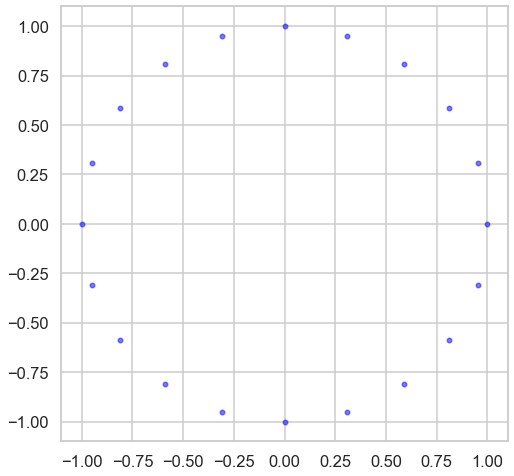

In [7]:
# prepare the figure sise and background 
# this part can be replaced by a number of subplots 
plt.rcParams['figure.figsize'] = [8,8]
sns.set_style("whitegrid")
sns.set_context("talk")
# Produce a data set that represent the x and y o coordinates of a circle 
# this part can be replaced by data that you import froma file 
angle = np.linspace(0,2*np.pi,20, endpoint = False)
X = np.append([np.cos(angle)],[np.sin(angle)],0).transpose()
# Data is displayed 
# to display the data only it is assumed that the number of clusters is zero which is the default of the fuction 
display_cluster(X)

> #### 2.3. Example 2 : Multi blob Data Gen and display 

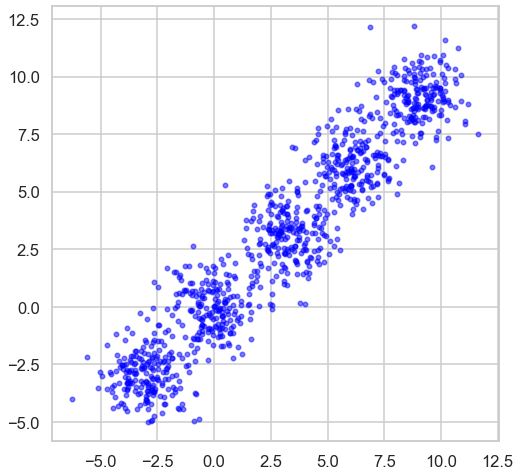

In [8]:
n_samples = 1000
n_bins = 4  
centers = [(-3, -3), (0, 0), (3, 3), (6, 6), (9,9)]
X, y = make_blobs(n_samples=n_samples, n_features=2, cluster_std=1.0,
                  centers=centers, shuffle=False, random_state=42)
display_cluster(X)

#### 2.3. Example 3 : moons Data Gen and display 

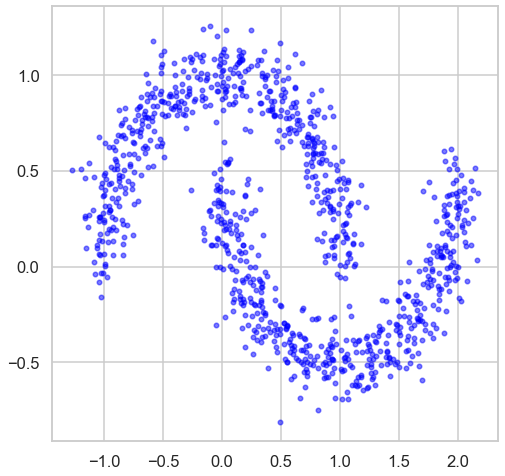

In [9]:
n_samples = 1000
X, y = noisy_moons = make_moons(n_samples=n_samples, noise= .1)
display_cluster(X)

## 3. Testing the GUC_Kmean function on Simple 2D
1. Apply the GUC_Kmean fucntion to 2D Data provided by example 1, Example 2 and Example 3
2. Try a varing number of cluster centriods that range from 2 to 10 clusters on each set 
3. Display your results.
4. plot the Cluster perfromance Metric versus the number of clusters
4. Change the distance function and repeat the above steps 

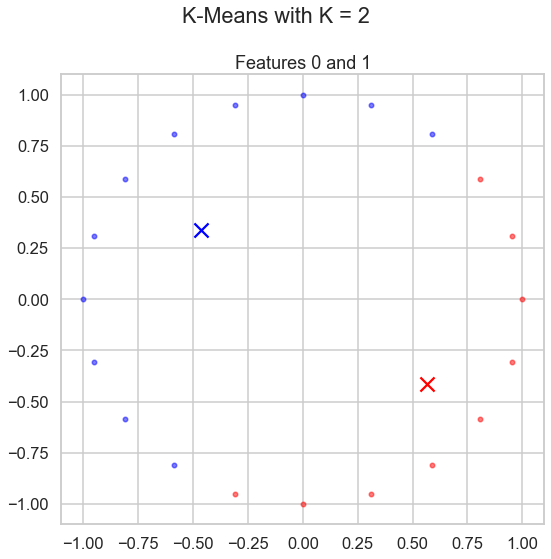

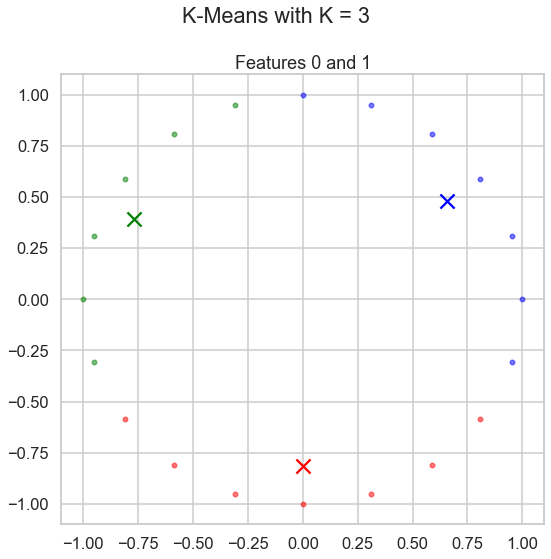

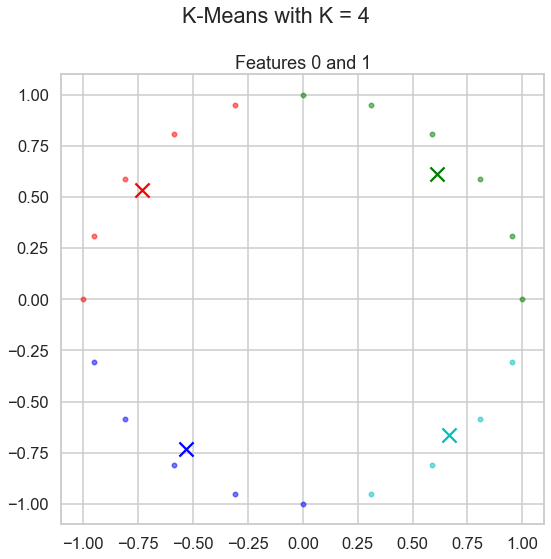

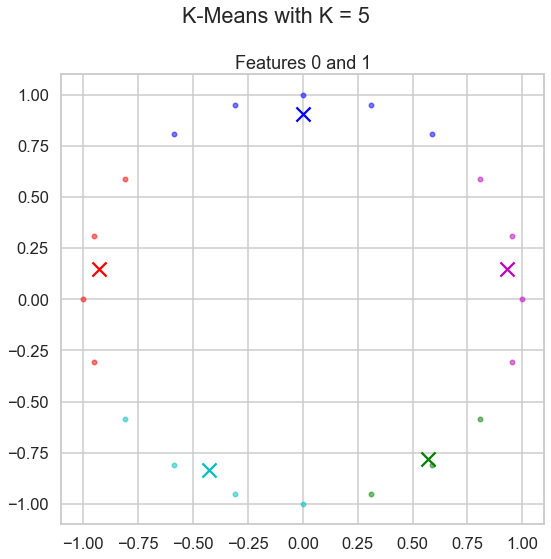

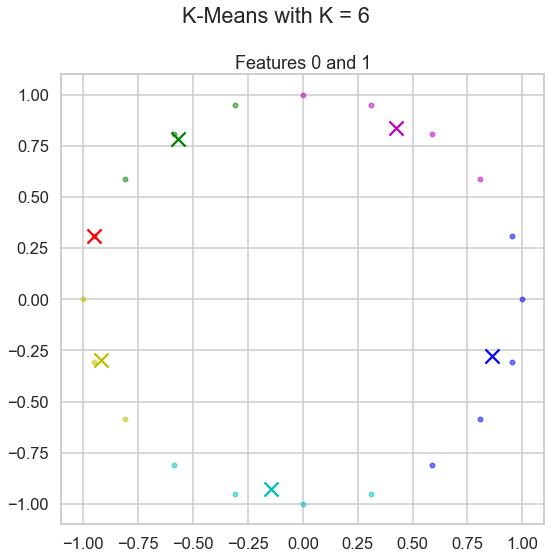

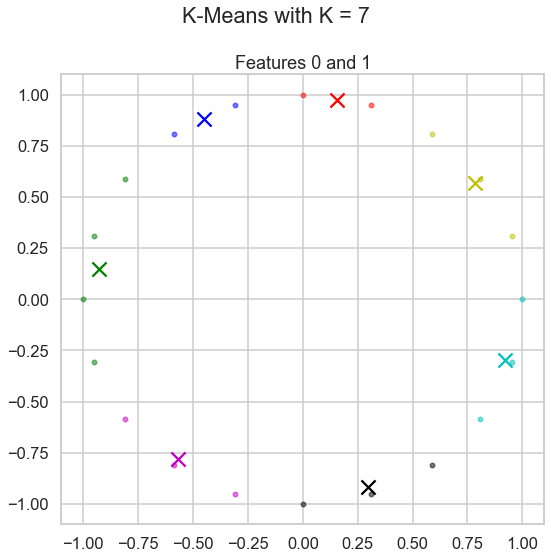

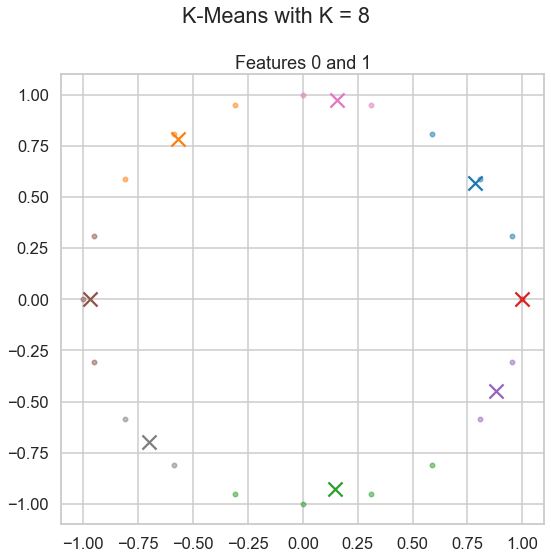

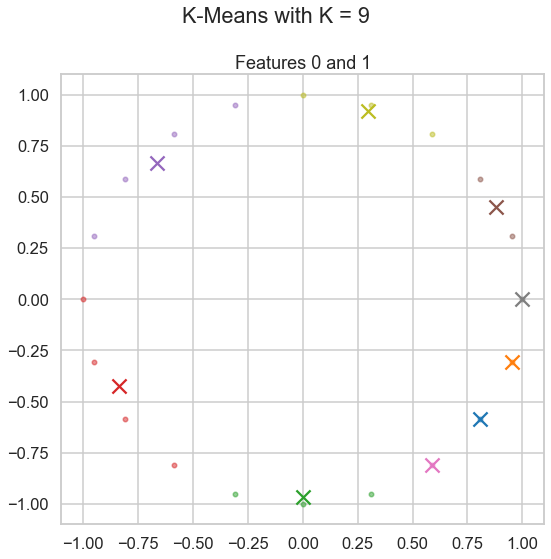

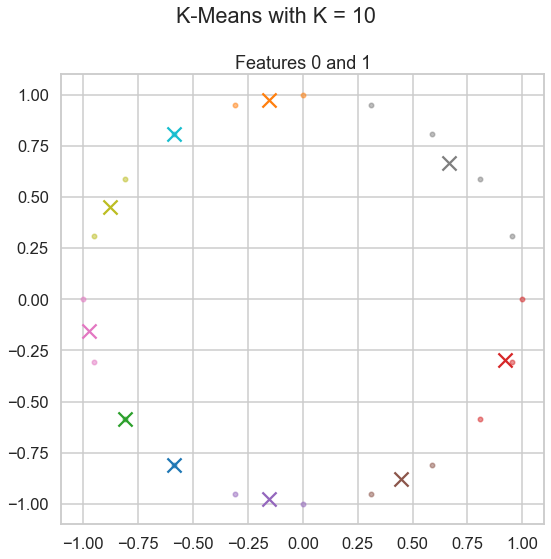

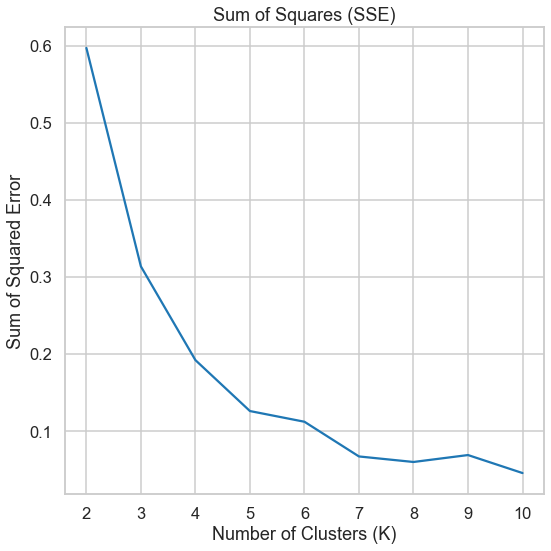

In [10]:
angle = np.linspace(0,2*np.pi,20, endpoint = False)
X = np.append([np.cos(angle)],[np.sin(angle)],0).transpose()
metrics = []
for num_clusters in range(2,11):
    fig = plt.figure()
    Final_Cluster_Distance, Cluster_Metric = GUC_Kmean(X, num_clusters, "Euclidean")
    metrics.append(Cluster_Metric)
    display_cluster(X, km=Final_Cluster_Distance, num_clusters=num_clusters)
    fig.suptitle(f"K-Means with K = {num_clusters}")
    fig.tight_layout()
plt.figure()
plt.plot(np.arange(2,11), metrics)
plt.title("Sum of Squares (SSE)")
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Sum of Squared Error")
plt.tight_layout()
plt.show()

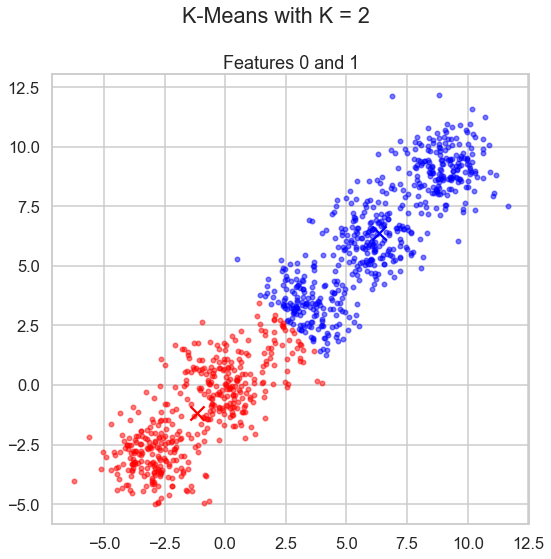

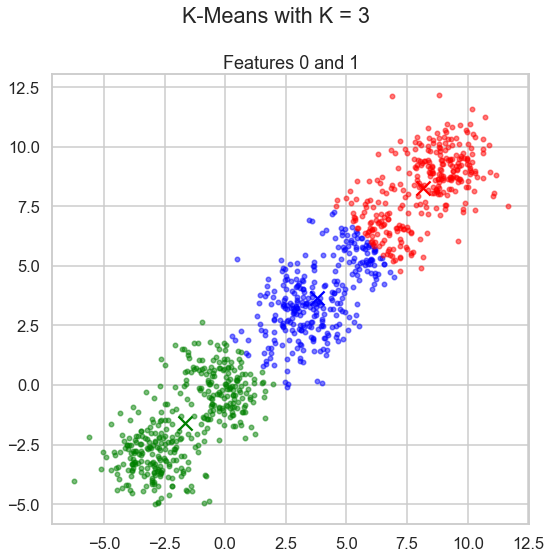

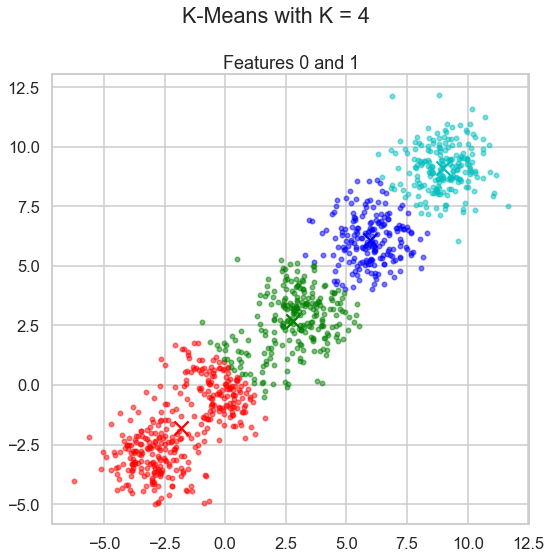

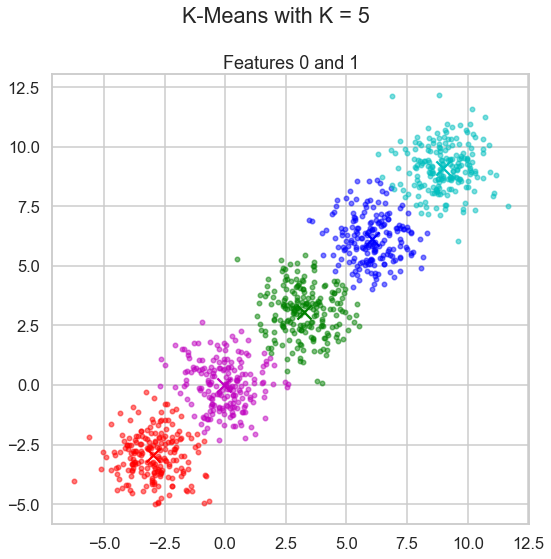

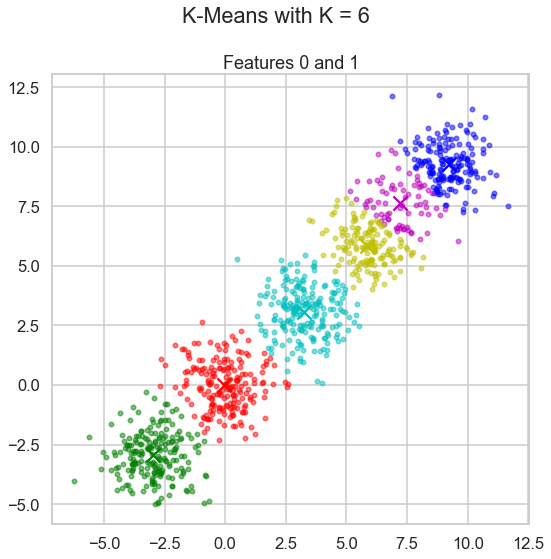

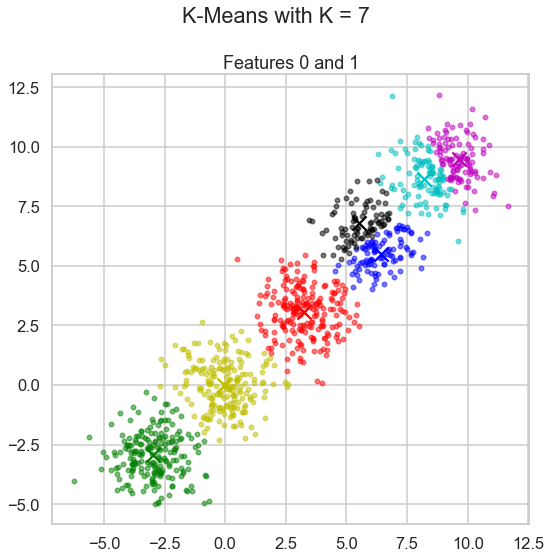

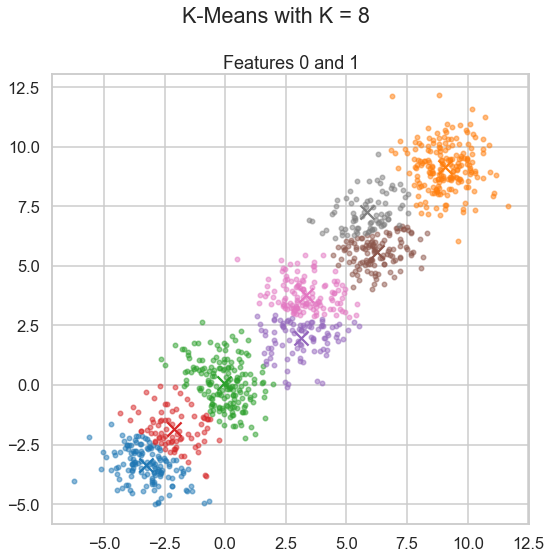

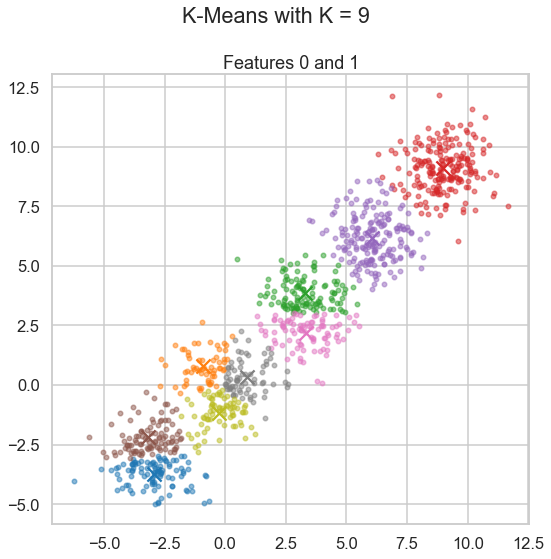

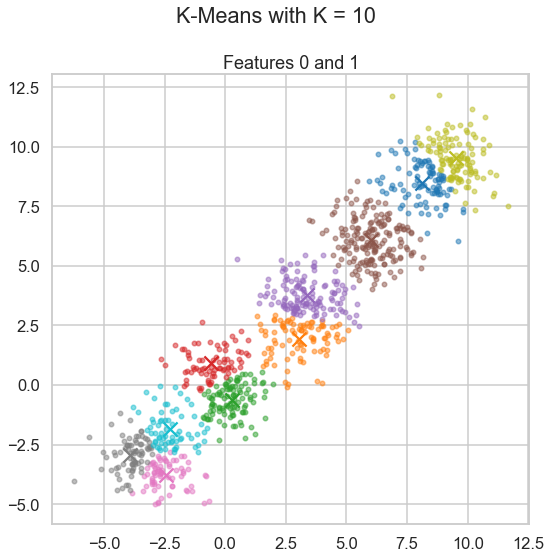

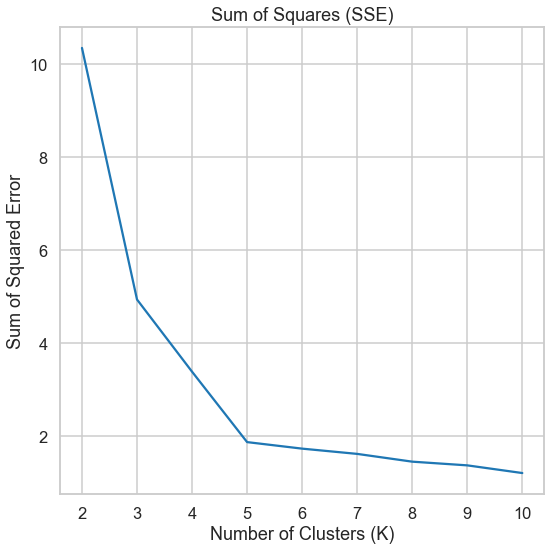

In [11]:
n_samples = 1000
n_bins = 4  
centers = [(-3, -3), (0, 0), (3, 3), (6, 6), (9,9)]
X, y = make_blobs(n_samples=n_samples, n_features=2, cluster_std=1.0,
                  centers=centers, shuffle=False, random_state=42)
metrics = []
for num_clusters in range(2,11):
    fig = plt.figure()
    Final_Cluster_Distance, Cluster_Metric = GUC_Kmean(X, num_clusters, "Euclidean")
    metrics.append(Cluster_Metric)
    display_cluster(X, km=Final_Cluster_Distance, num_clusters=num_clusters)
    fig.suptitle(f"K-Means with K = {num_clusters}")
    fig.tight_layout()
plt.figure()
plt.plot(np.arange(2,11), metrics)
plt.title("Sum of Squares (SSE)")
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Sum of Squared Error")
plt.tight_layout()
plt.show()

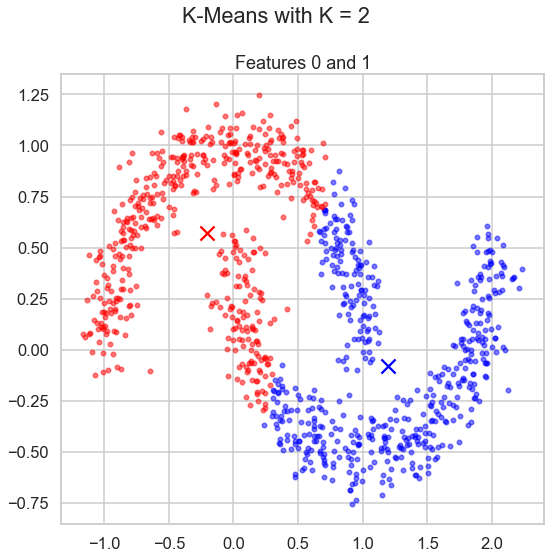

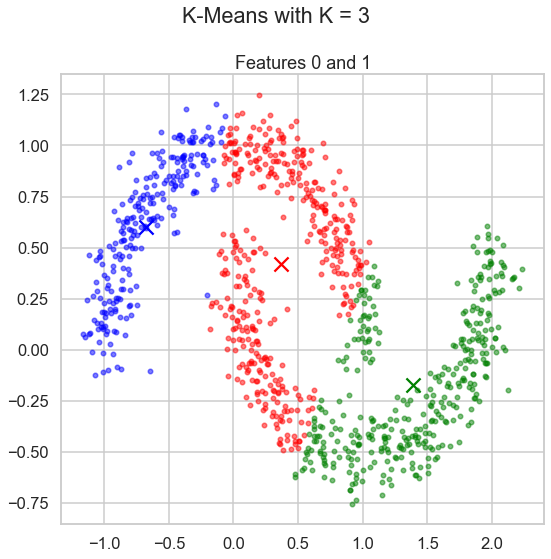

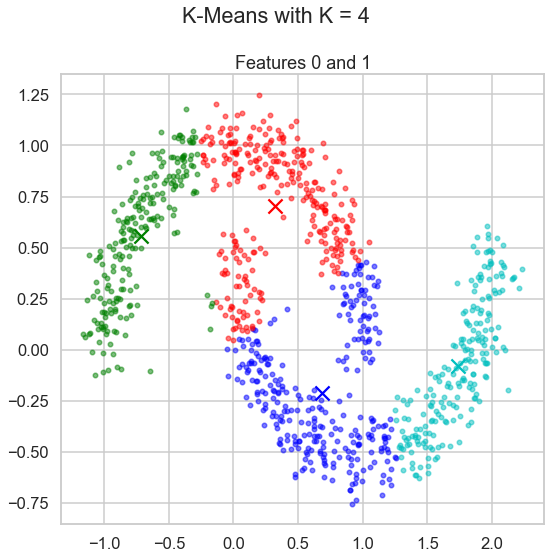

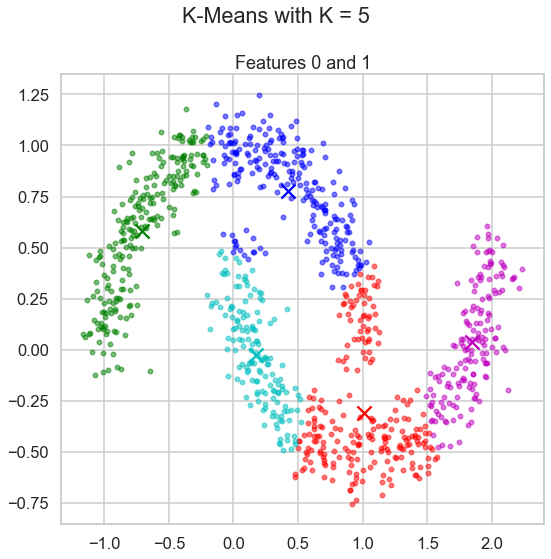

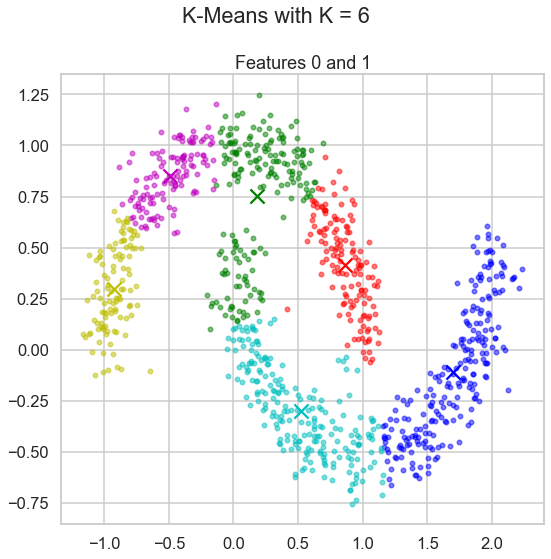

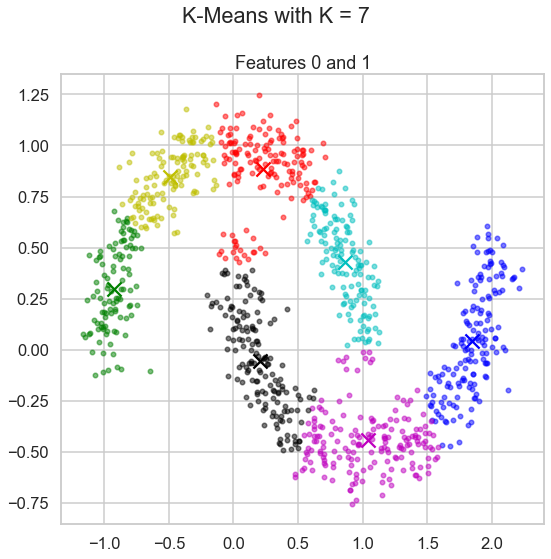

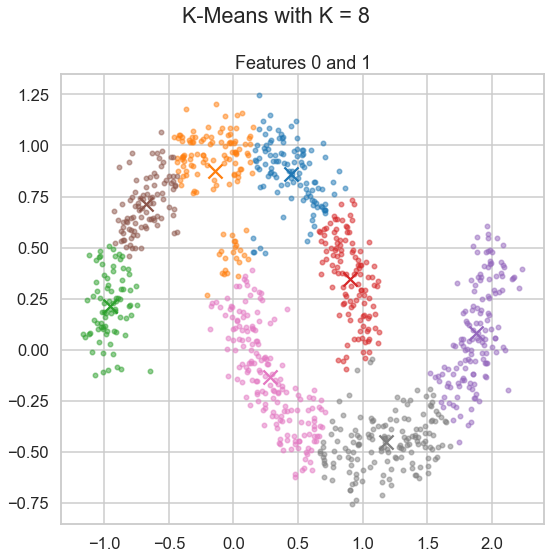

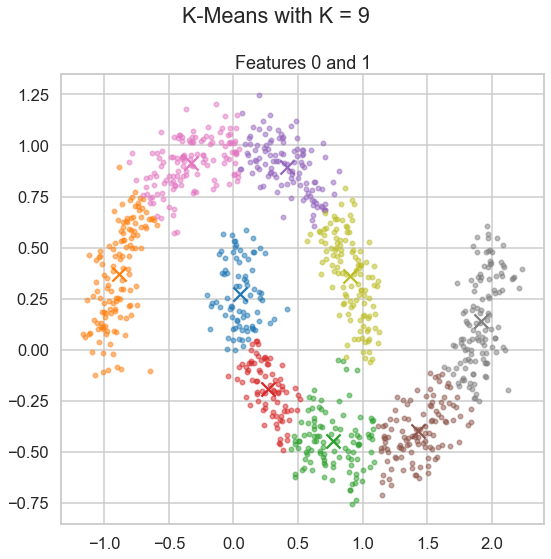

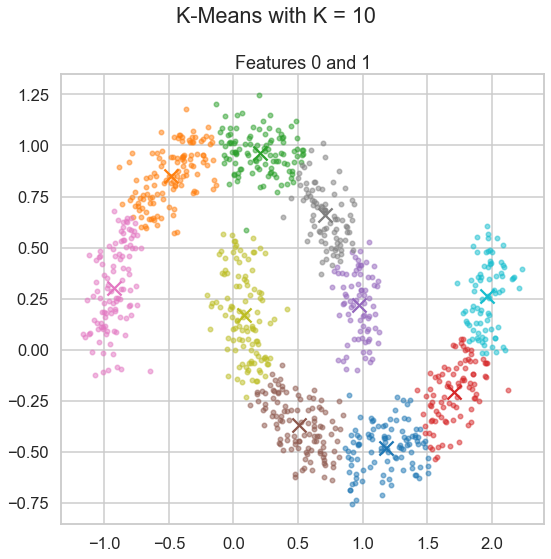

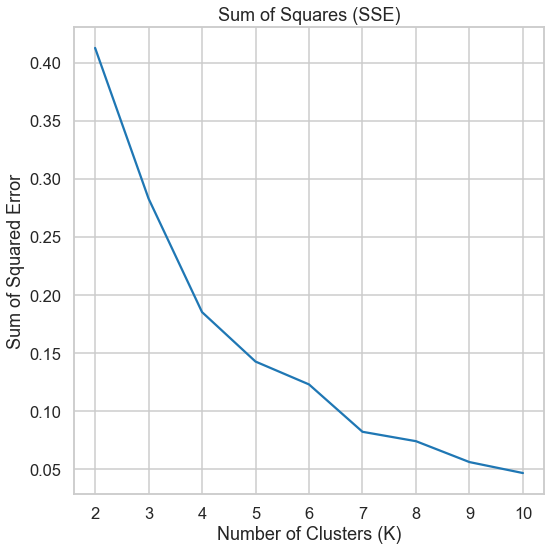

In [12]:
n_samples = 1000
X, y = noisy_moons = make_moons(n_samples=n_samples, noise= .1)
metrics = []
for num_clusters in range(2,11):
    fig = plt.figure()
    Final_Cluster_Distance, Cluster_Metric = GUC_Kmean(X, num_clusters, "Euclidean")
    metrics.append(Cluster_Metric)
    display_cluster(X, km=Final_Cluster_Distance, num_clusters=num_clusters)
    fig.suptitle(f"K-Means with K = {num_clusters}")
    fig.tight_layout()
plt.figure()
plt.plot(np.arange(2,11), metrics)
plt.title("Sum of Squares (SSE)")
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Sum of Squared Error")
plt.tight_layout()
plt.show()

## 4. Using the GUC_Kmean function to segment customers int he provided customer dataset
1. Apply the GUC_Kmean fucntion to customer data  
2. Try a varing number of cluster that range from 2 to 10 cluster on each set 
3. Display your results.
4. plot the Cluster Metric versus the number of clusters
4. Change the distance function and repeat the above steps 

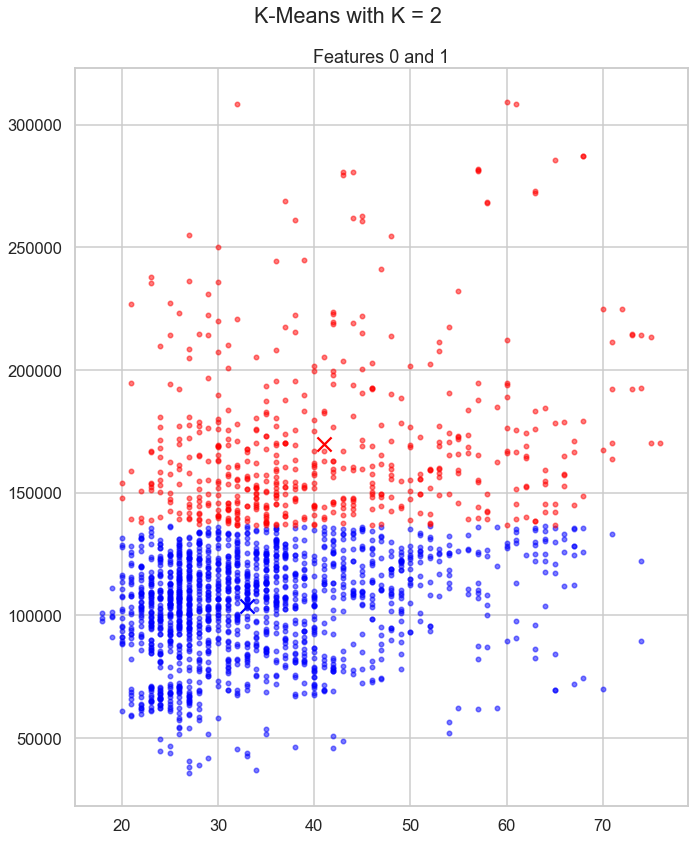

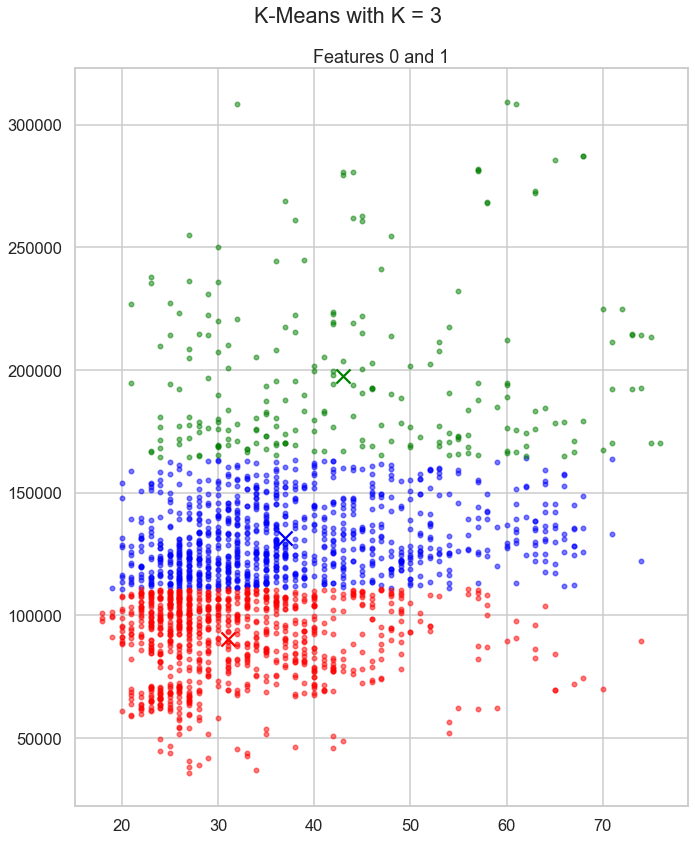

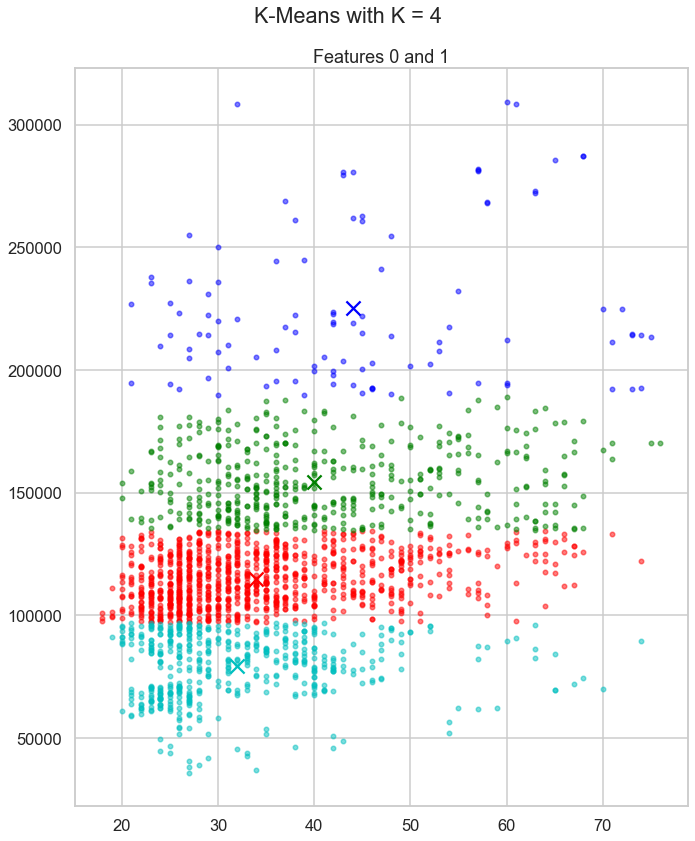

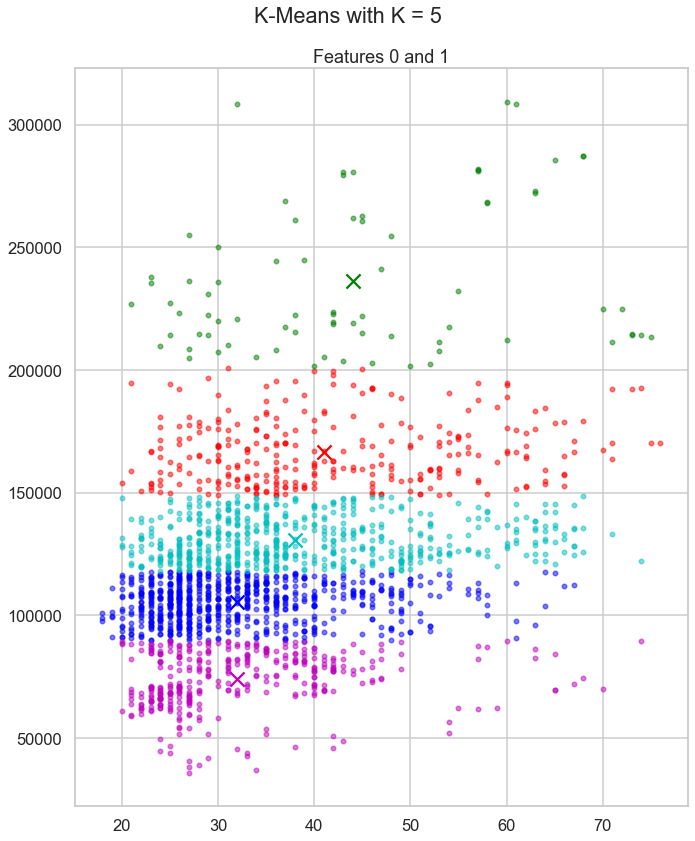

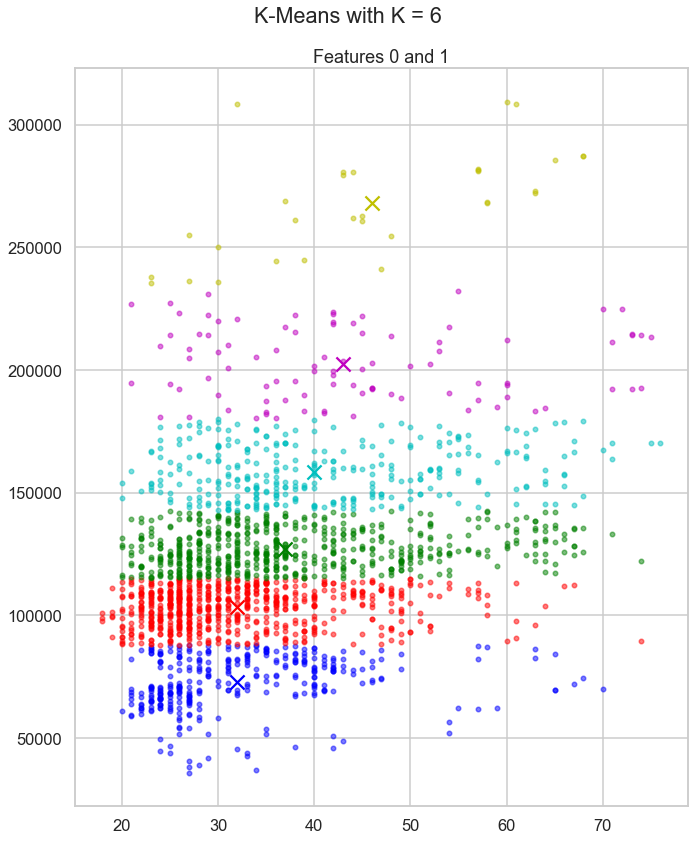

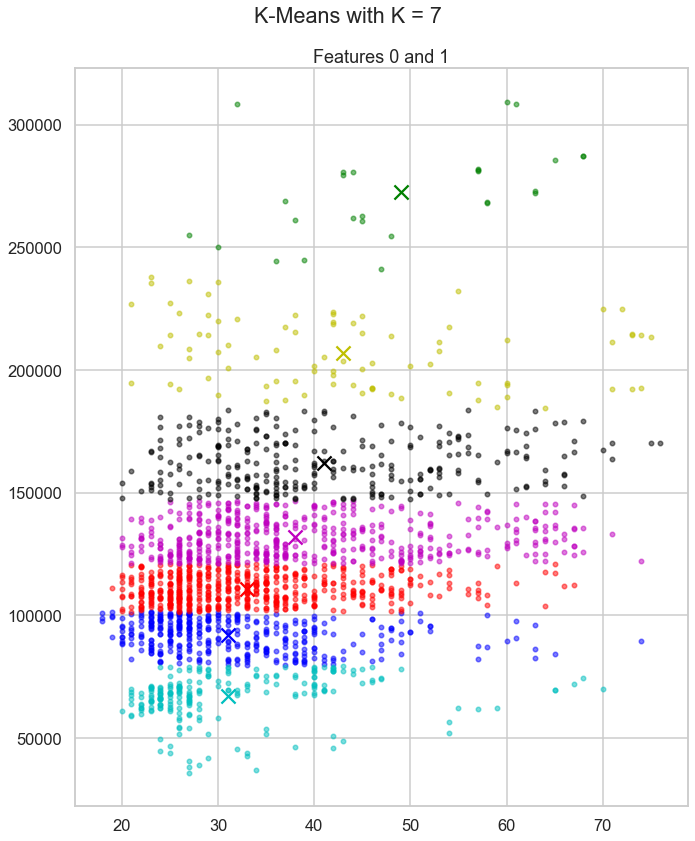

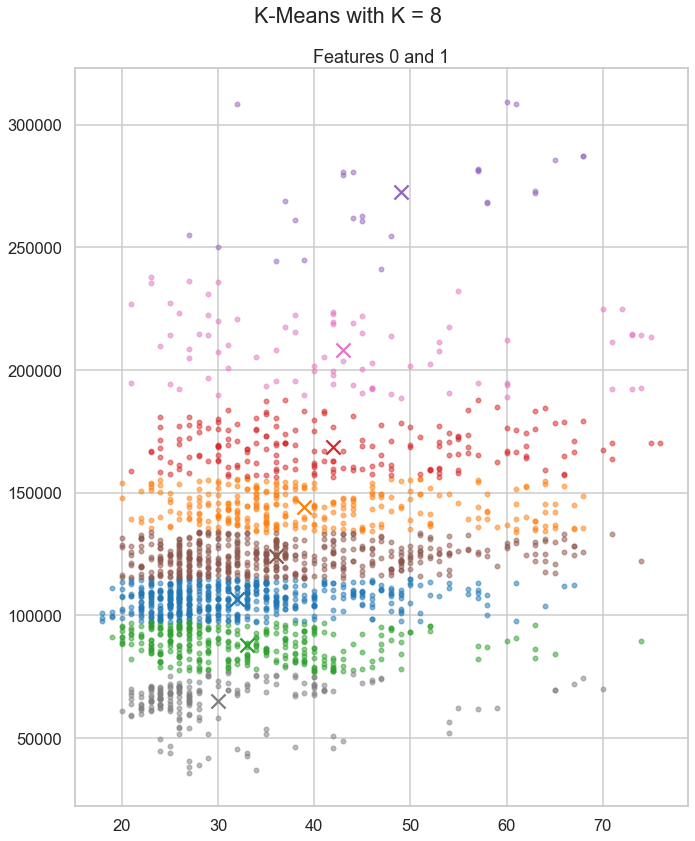

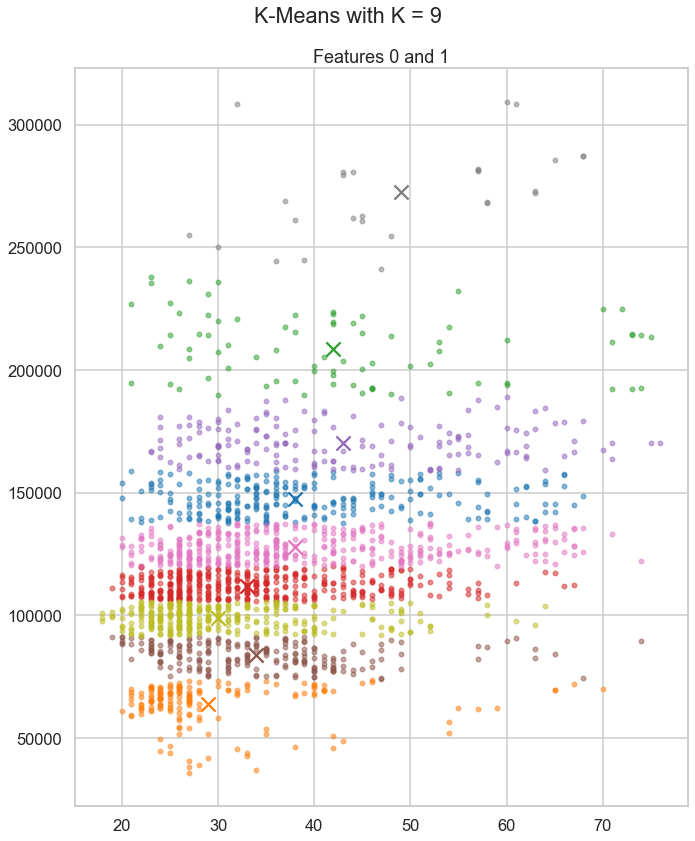

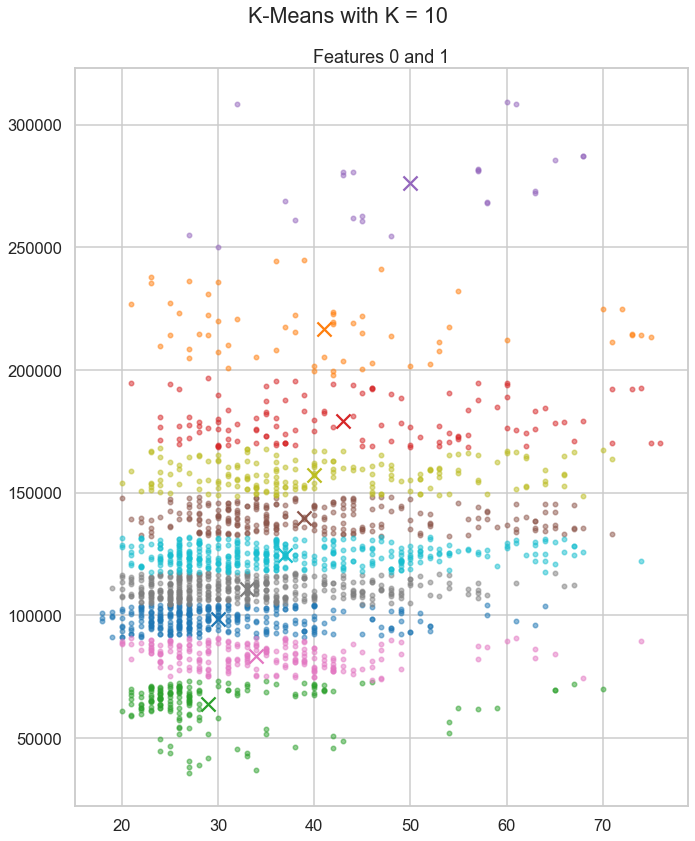

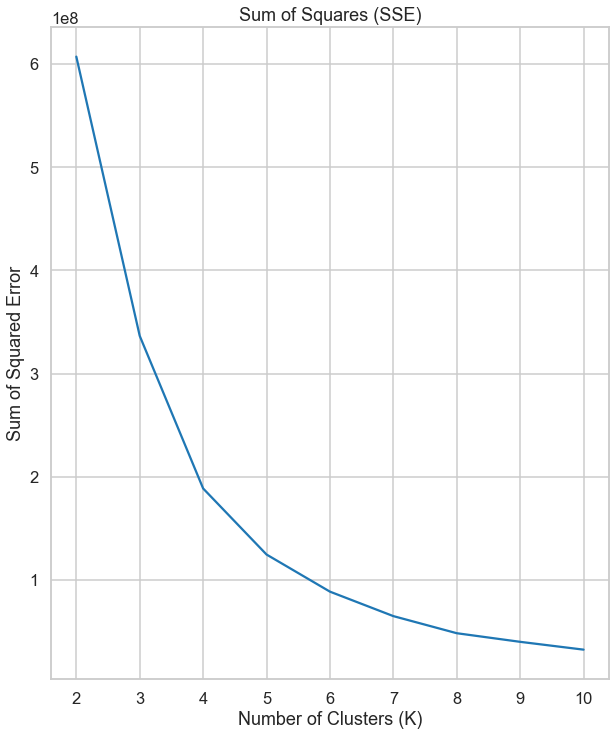

In [13]:
import pandas as pd
df = pd.read_csv("C:\\Users\\Karim\\Downloads\\College\\Semester 10\\NETW1013 - Machine Learning\\Week 2\\Assignment 1\\Customer data.csv")
X = np.array([df["Age"], df["Income"]]).transpose()
metrics = []
for num_clusters in range(2,11):
    Final_Cluster_Distance, Cluster_Metric = GUC_Kmean(X, num_clusters, "Euclidean")
    metrics.append(Cluster_Metric)
    fig = plt.figure(figsize=(10,12))
    display_cluster(X, km=Final_Cluster_Distance, num_clusters=num_clusters)
    fig.suptitle(f"K-Means with K = {num_clusters}")
    fig.tight_layout()
plt.figure(figsize=(10,12))
plt.plot(np.arange(2,11), metrics)
plt.title("Sum of Squares (SSE)")
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Sum of Squared Error")
plt.show()

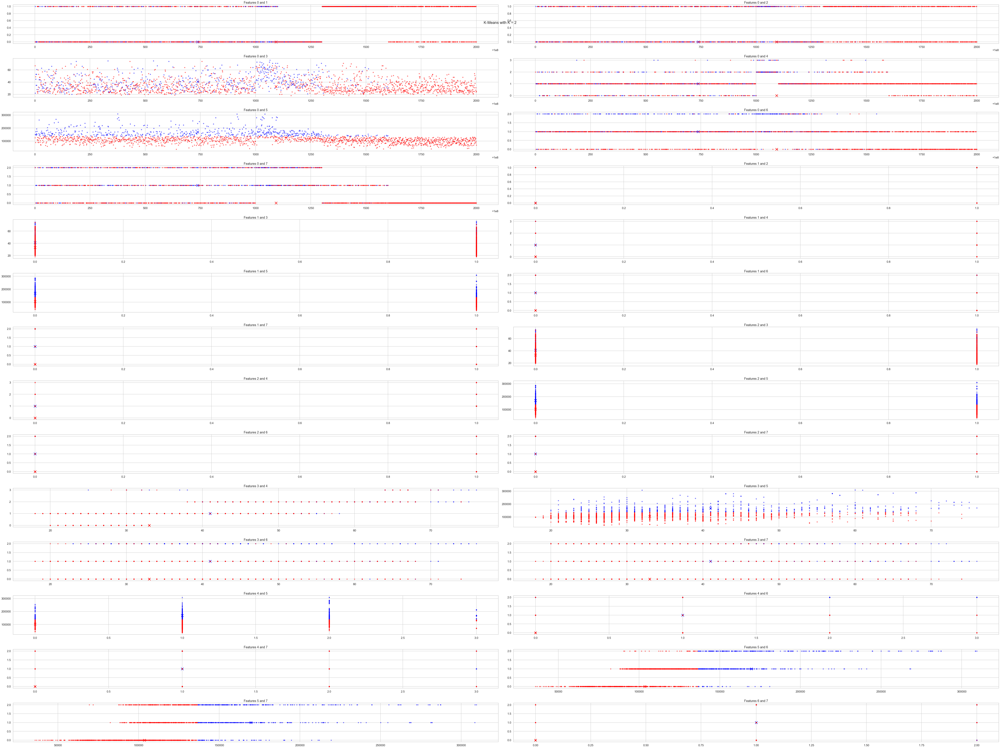

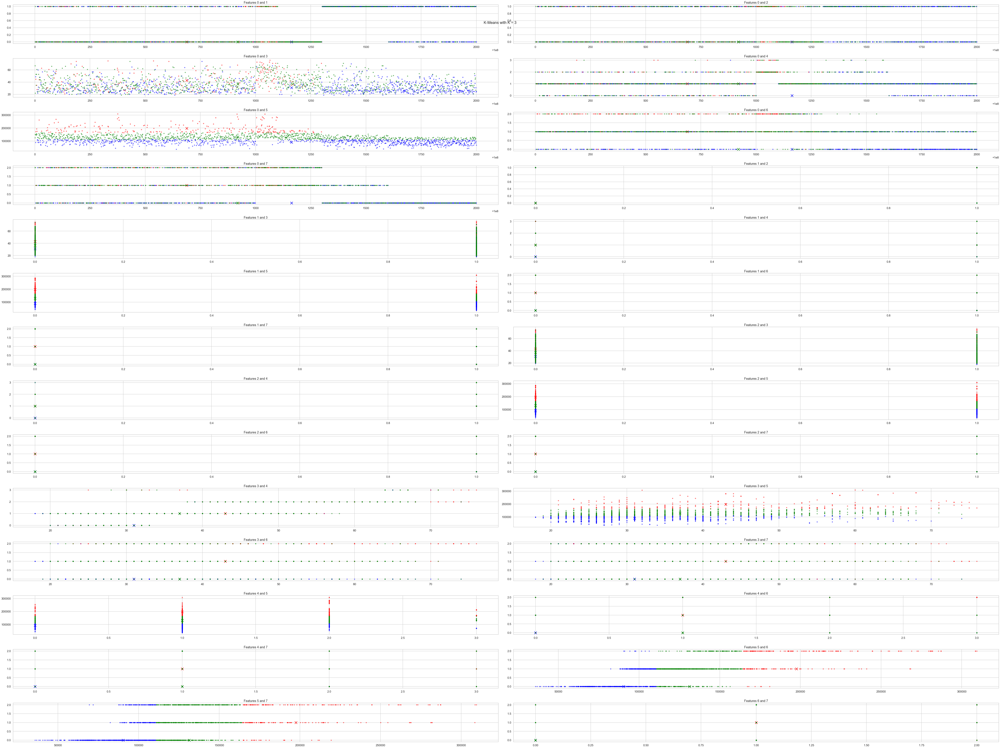

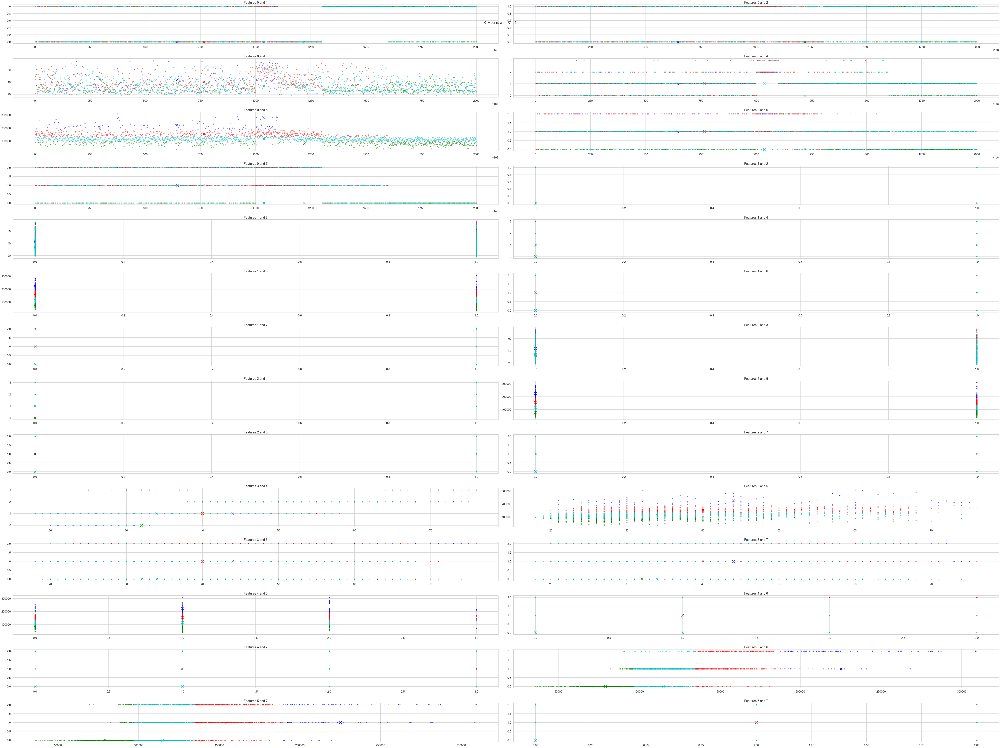

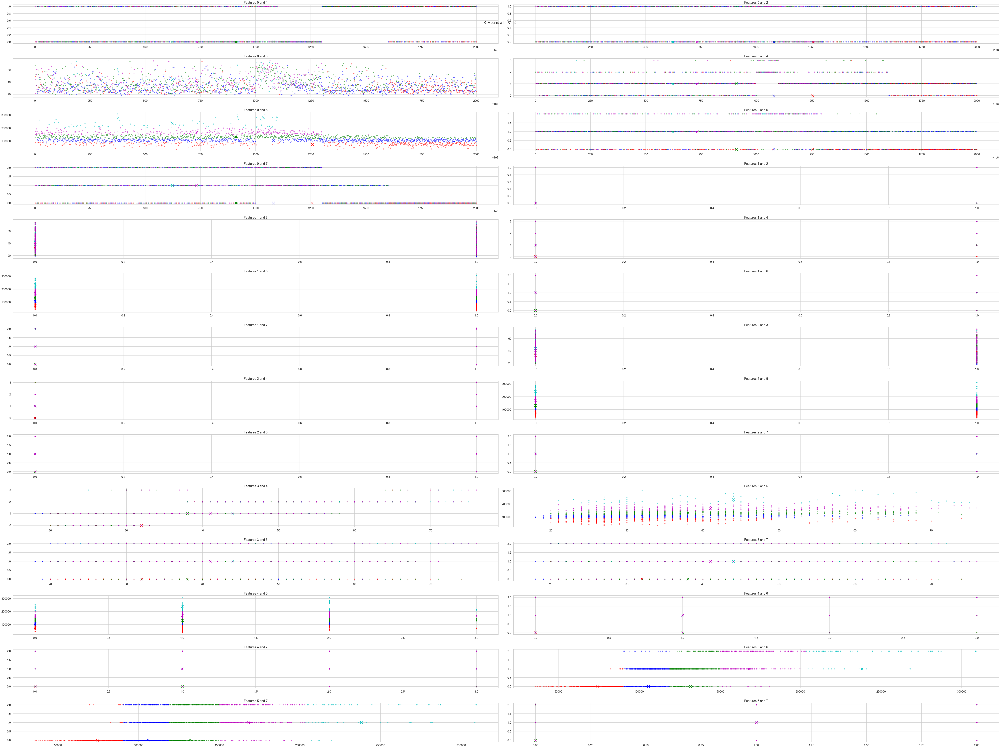

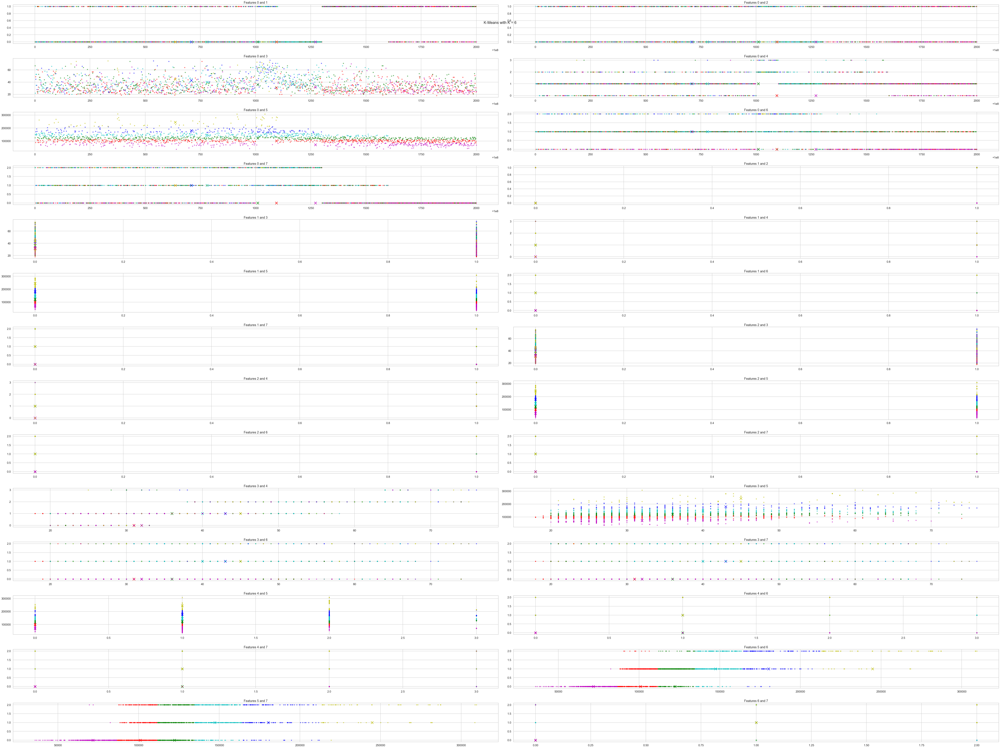

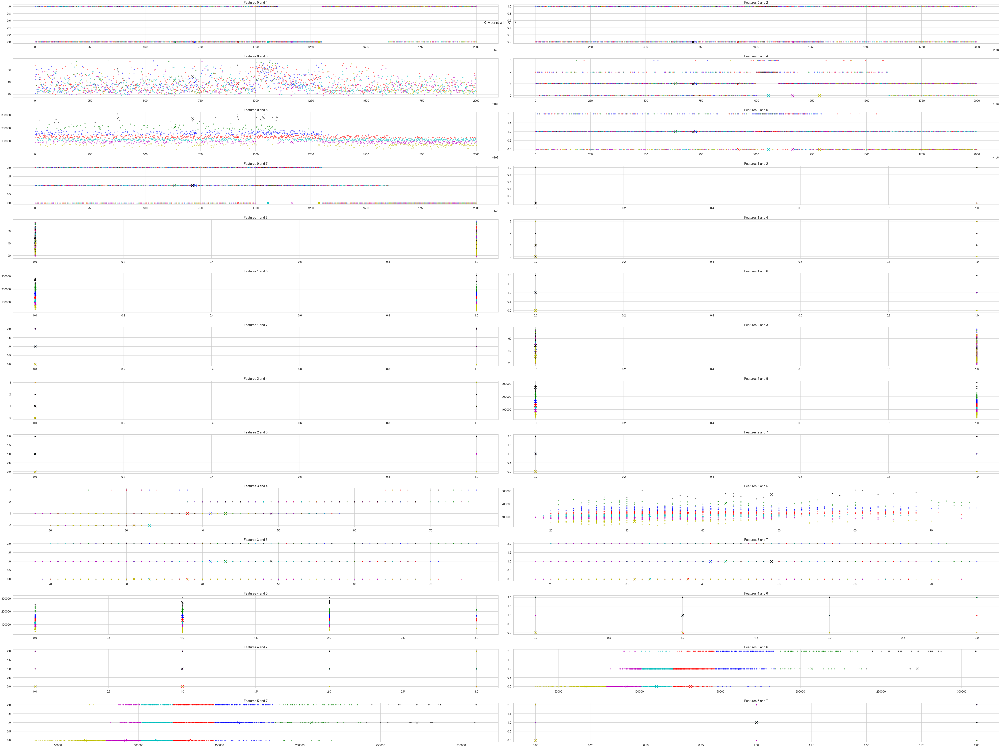

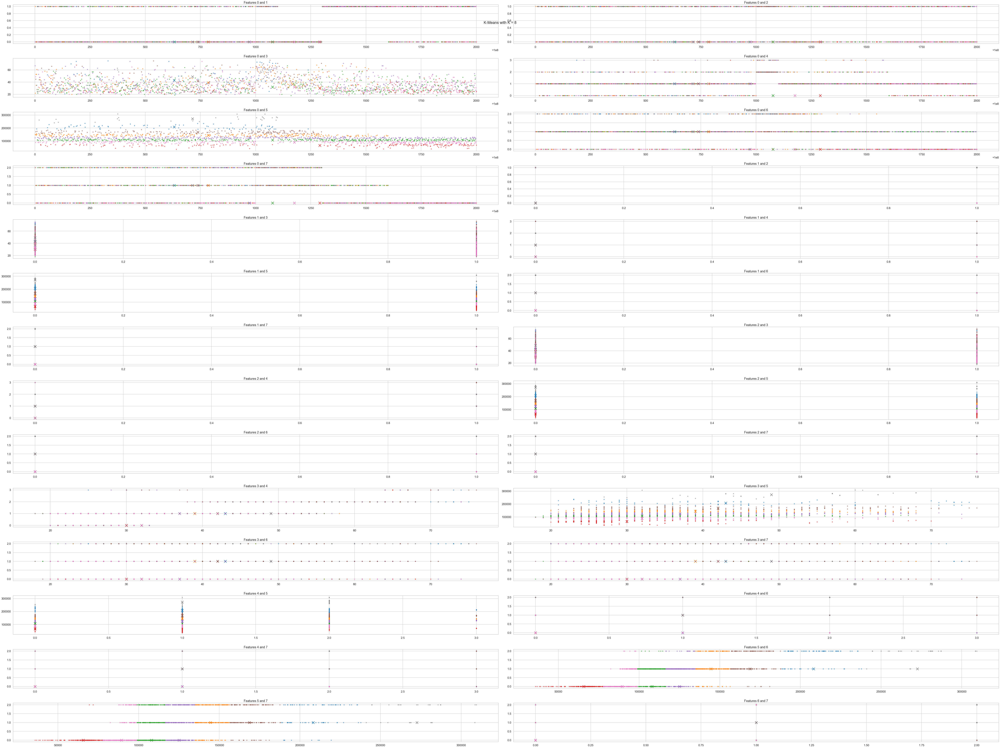

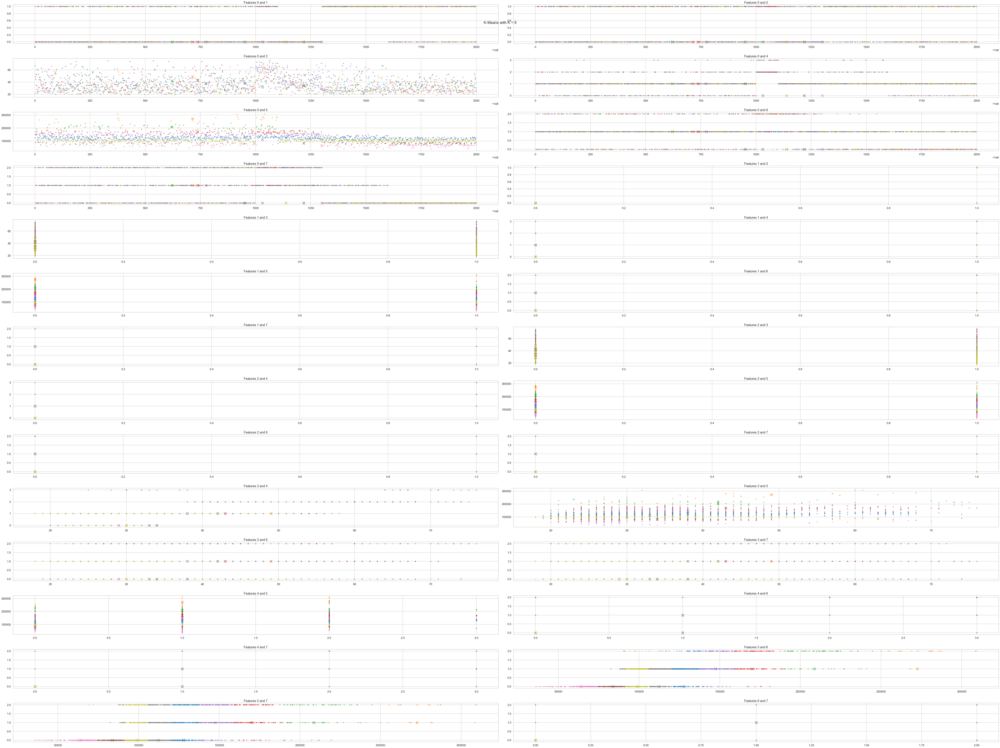

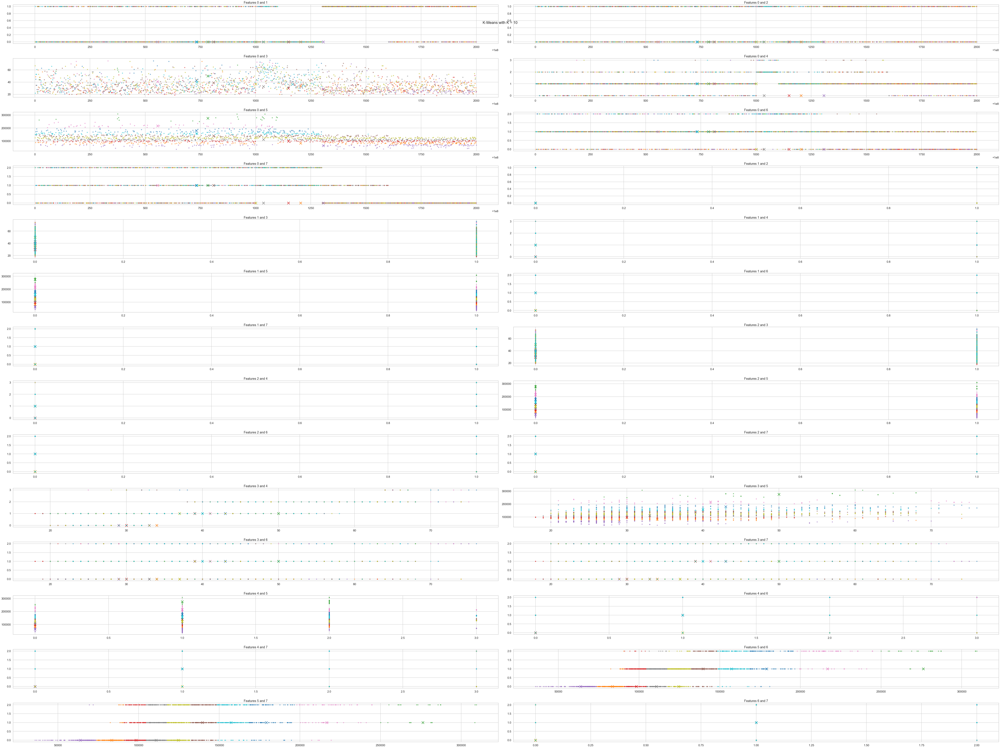

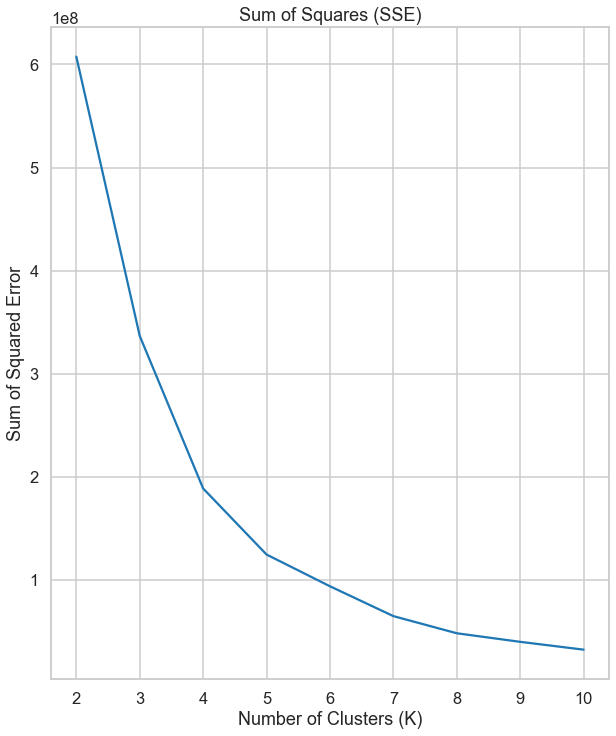

In [14]:
import pandas as pd
df = pd.read_csv("C:\\Users\\Karim\\Downloads\\College\\Semester 10\\NETW1013 - Machine Learning\\Week 2\\Assignment 1\\Customer data.csv")
X = df.values
metrics = []
for num_clusters in range(2,11):
    Final_Cluster_Distance, Cluster_Metric = GUC_Kmean(X, num_clusters, "Euclidean")
    metrics.append(Cluster_Metric)
    fig = plt.figure(figsize=(80,120))
    display_cluster(X, km=Final_Cluster_Distance, num_clusters=num_clusters)
    fig.suptitle(f"K-Means with K = {num_clusters}")
    fig.tight_layout()
plt.figure(figsize=(10,12))
plt.plot(np.arange(2,11), metrics)
plt.title("Sum of Squares (SSE)")
plt.xlabel("Number of Clusters (K)")
plt.ylabel("Sum of Squared Error")
plt.show()